## HCP individualized connectome prediction evaluation

In [98]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *

In [99]:
import importlib
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

In [100]:
import models
from models import *
from models import CrossModalPCA
importlib.reload(models)
from models import *

import importlib
import eval
importlib.reload(eval)
from eval import *

importlib.reload(eval)
import eval
from eval import *

importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
import data 

### PCA (FC-to-FC) Autoencoder model (256 components)

In [8]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="FC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=256)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [21]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

train_metrics = train_evaluator._metrics
val_metrics = val_evaluator._metrics
test_metrics = test_evaluator._metrics

train_evaluator._output_metrics()
val_evaluator._output_metrics()
test_evaluator._output_metrics()

 Evaluation Metrics for Partition: 'train'
--------------------------------------------------
Mean Squared Error       : 0.0031
R2 Score                 : 0.7463
Pearson Corr.            : 0.9625
Demeaned Pearson Corr.   : 0.8707
Average Rank             : 1.0000
Top-1 Accuracy           : 1.0000
 Evaluation Metrics for Partition: 'val'
--------------------------------------------------
Mean Squared Error       : 0.0076
R2 Score                 : 0.4118
Pearson Corr.            : 0.9115
Demeaned Pearson Corr.   : 0.6770
Average Rank             : 1.0000
Top-1 Accuracy           : 1.0000
 Evaluation Metrics for Partition: 'test'
--------------------------------------------------
Mean Squared Error       : 0.0072
R2 Score                 : 0.4082
Pearson Corr.            : 0.9129
Demeaned Pearson Corr.   : 0.6681
Average Rank             : 0.9999
Top-1 Accuracy           : 0.9949


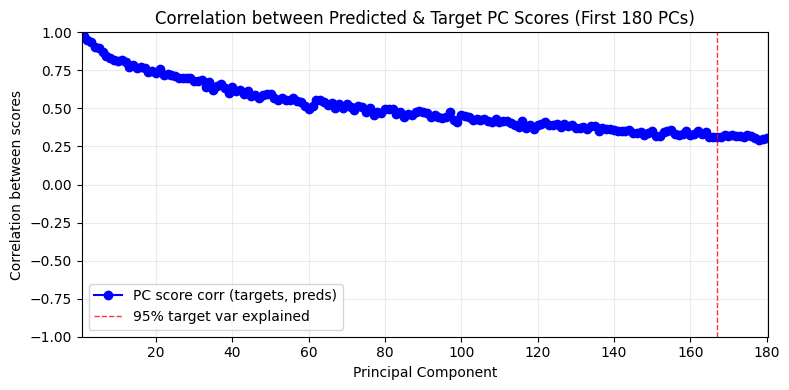

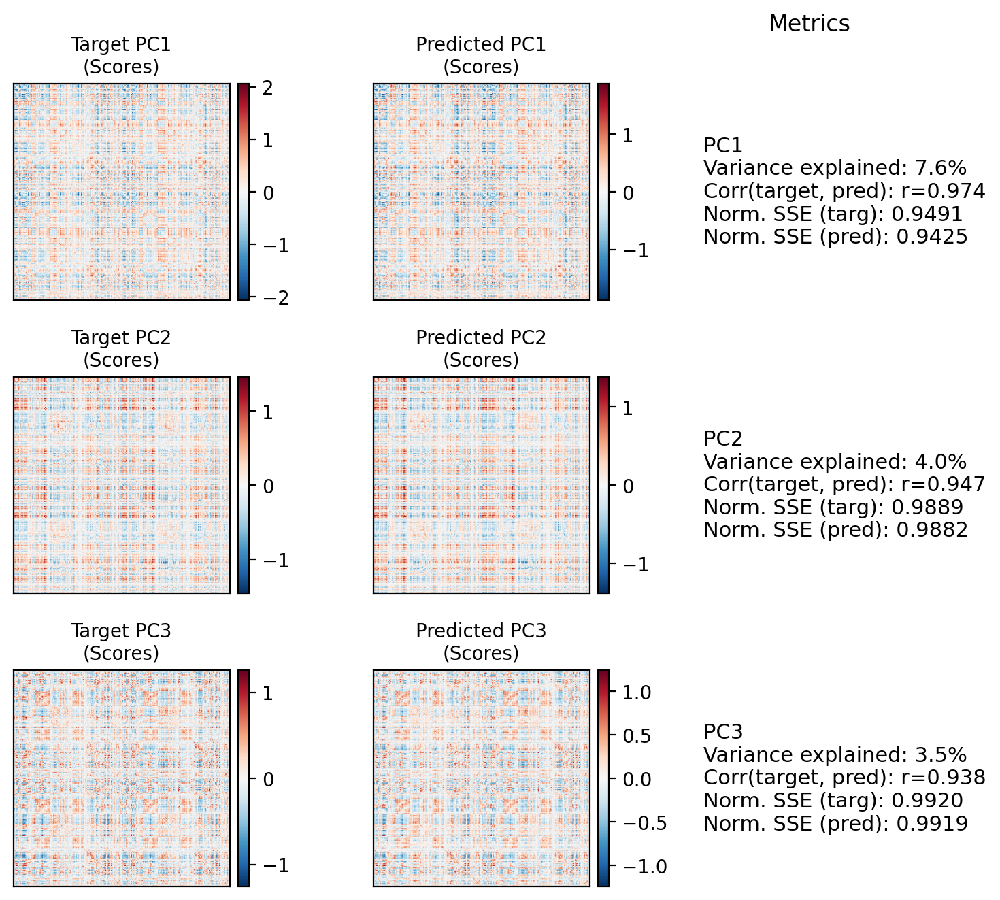

(PCA(), PCA())

In [22]:
test_evaluator.evaluate_pca_structure(num_pcs=180, show_first_pcs=3)

Number of unique categories: 34


Top-1 accuracy: 1.000  (195 of 195 subjects had rank 1)
Average rank percentile: 0.995


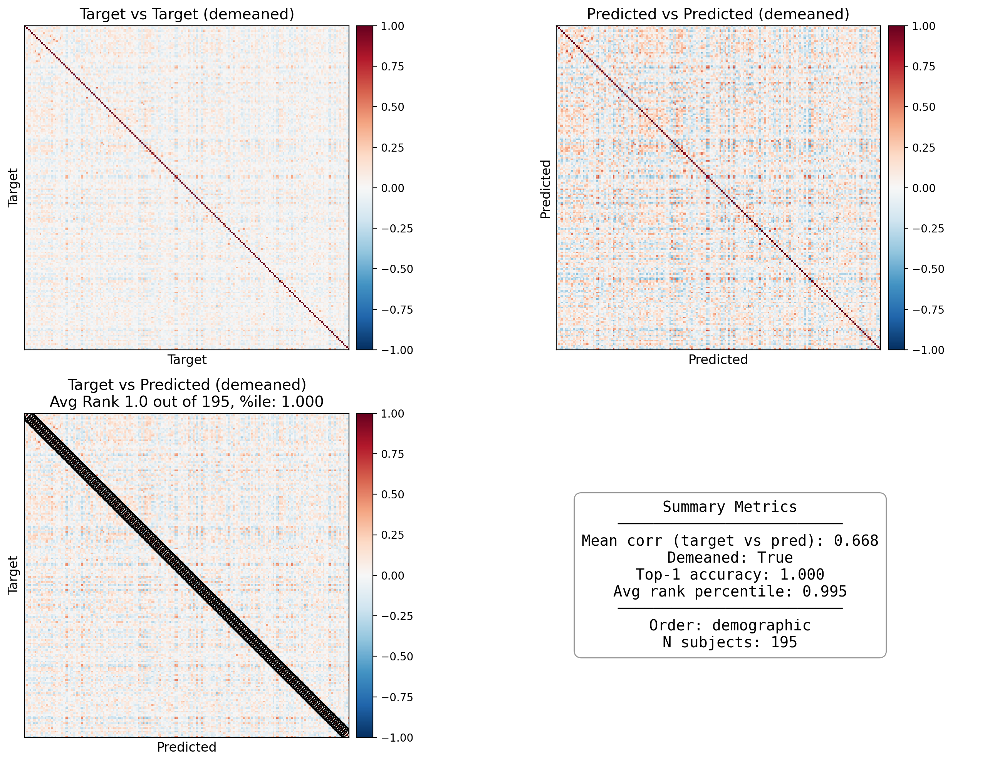

{'mean_corr': np.float64(0.6680823576277245),
 'demeaned': True,
 'top1_acc': np.float64(1.0),
 'avg_rank_percentile': np.float64(0.9948717948717949),
 'ranklist': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])}

In [23]:
test_evaluator.plot_identifiability_heatmaps(order_by='demographic', demeaned=True, include_black_circles=True, include_blue_dots=False, dpi=200, figsize=(14, 10))

### Cross-modal (SC-to-FC) PCA model

In [9]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="SC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=256)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [10]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

train_metrics = train_evaluator._metrics
val_metrics = val_evaluator._metrics
test_metrics = test_evaluator._metrics

train_evaluator._output_metrics()
val_evaluator._output_metrics()
test_evaluator._output_metrics()

 Evaluation Metrics for Partition: 'train'
--------------------------------------------------
Mean Squared Error       : 0.0179
R2 Score                 : -0.2945
Pearson Corr.            : 0.7840
Demeaned Pearson Corr.   : 0.0020
Average Rank             : 0.5008
Top-1 Accuracy           : 0.0015
 Evaluation Metrics for Partition: 'val'
--------------------------------------------------
Mean Squared Error       : 0.0164
R2 Score                 : -0.1594
Pearson Corr.            : 0.8047
Demeaned Pearson Corr.   : 0.0164
Average Rank             : 0.5151
Top-1 Accuracy           : 0.0000
 Evaluation Metrics for Partition: 'test'
--------------------------------------------------
Mean Squared Error       : 0.0156
R2 Score                 : -0.1746
Pearson Corr.            : 0.8117
Demeaned Pearson Corr.   : 0.0104
Average Rank             : 0.5079
Top-1 Accuracy           : 0.0051


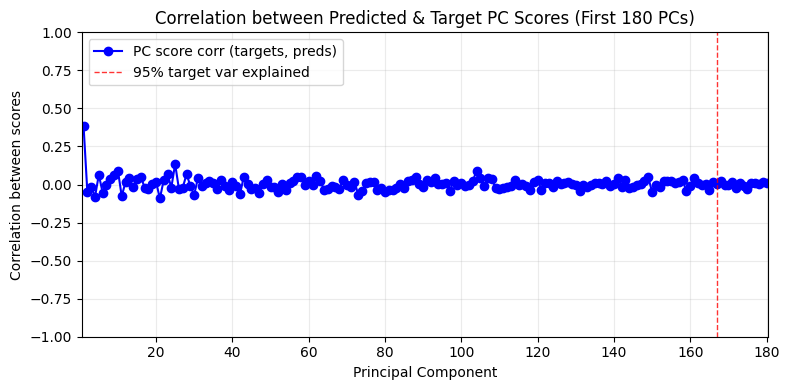

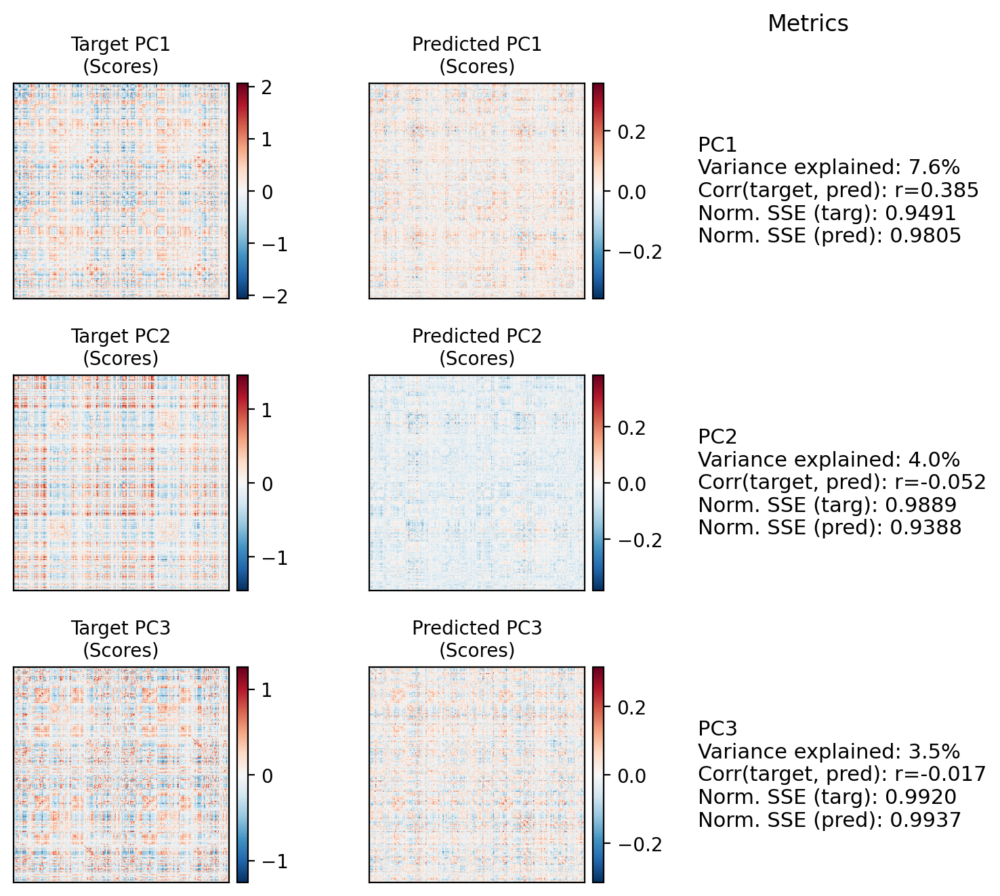

(PCA(), PCA())

In [11]:
test_evaluator.evaluate_pca_structure(num_pcs=180, show_first_pcs=3)

Number of unique categories: 34


Top-1 accuracy: 0.000  (0 of 195 subjects had rank 1)
Average rank percentile: 0.539


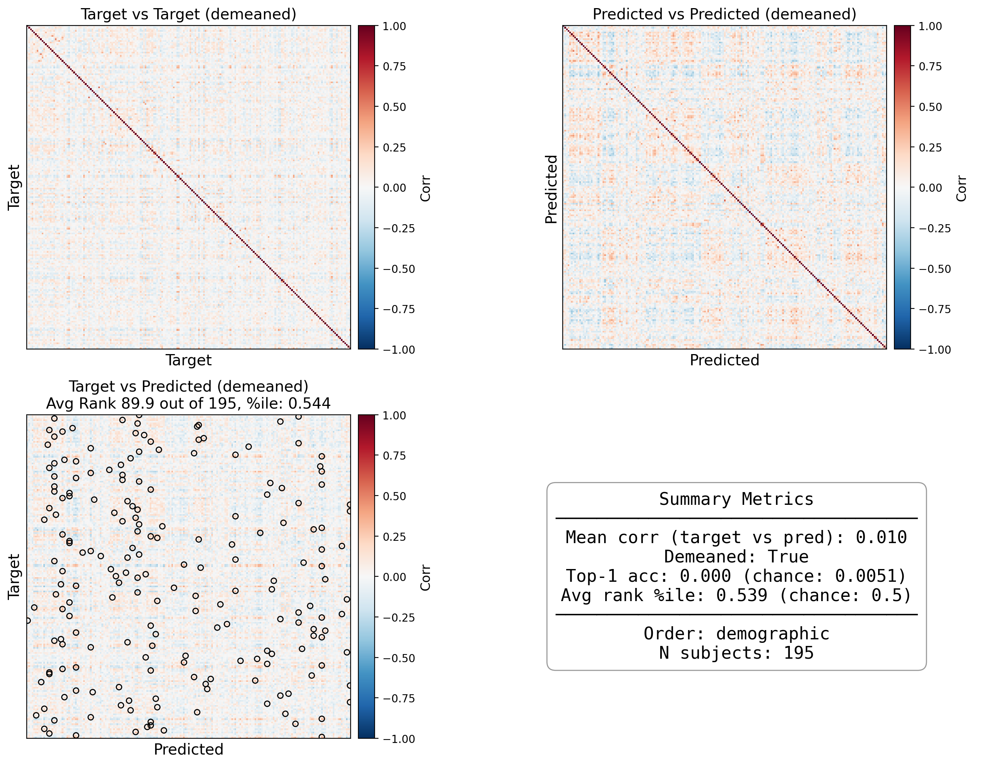

{'mean_corr': np.float64(0.010410745502828247),
 'demeaned': True,
 'top1_acc': np.float64(0.0),
 'avg_rank_percentile': np.float64(0.5387771203155818),
 'ranklist': array([ 92,  49, 163, 176, 100,  52,  32,  13,  64, 182,  59, 150,  30,
        149,  76,  55, 123,  74, 116, 104,   8,  69,  95, 138,  21,  16,
        118, 161,   6, 163, 152,  61,  78,  55,  18, 146,  68, 115,  11,
        166, 188, 154, 110,  83,  36, 128, 124,  15, 104,  51,  41,  35,
         20,  86,  14,  98,  40,  14,  78, 156,  60, 108,  11, 115,  65,
        184, 168,  23, 105, 114,  26,  88,  61,  30,  28,  12,  54, 147,
        171,  28,  62, 133, 152, 124,  74,  15,  79,  35,  13, 114,  42,
         58, 113,  23, 187,  88,  50,  66, 149,  76,   7,   5,   3, 159,
         11, 137, 155, 178,   6, 140, 189,  46,  65, 183,  63,  35,  24,
        102,  81,   7,  55, 169,  60, 195, 140, 195, 173,  94, 190, 177,
        105,  29, 146, 146,  50, 110, 167, 167, 193, 191,   3, 162,  18,
        161,  40,  74, 131, 114,

In [12]:
test_evaluator.plot_identifiability_heatmaps(order_by='demographic', demeaned=True, include_black_circles=True, include_blue_dots=False, dpi=200, figsize=(14, 10))

In [13]:
def plot_pca_inference_with_null(model, partition, subj_idx=None, seed=None):
    """
    Performs inference using a trained CrossModalPCA model on a random subject from the partition.
    Displays three matrices side by side:
      - Left: True target (y)
      - Middle: Predicted target (y_hat)
      - Right: Null prediction (shuffled latent z -> decoded)

    Plots both the original output and the demeaned output as two rows.

    Args:
        model: Trained CrossModalPCA model
        partition: HCP_Partition dataset (train, val, or test)
        train_mean: Mean of training targets (1D vector, used for demeaning, same shape as y)
        subj_idx: Optional subject index. If None, selects randomly.
        seed: Optional random seed for reproducibility

    Returns:
        dict with 'subj_idx', 'y_true', 'y_pred', 'y_null' (all as numpy arrays)
    """
    if seed is not None:
        np.random.seed(seed)
        torch.manual_seed(seed)

    # Select random subject if not specified
    if subj_idx is None:
        subj_idx = np.random.randint(0, len(partition))

    # Get data for this subject
    sample = partition[subj_idx]
    x = sample['x'].unsqueeze(0)  # (1, d)
    y_true = sample['y']  # (d,)

    # 1. Standard prediction: x -> z -> y_hat
    model.eval()
    with torch.no_grad():
        y_pred = model(x).squeeze(0)  # (d,)

    # 2. Null prediction: x -> z -> shuffle(z) -> y_null
    with torch.no_grad():
        x_float = x.to(model.device).to(torch.float32)
        x_centered = x_float - model.source_mean_
        z = torch.matmul(x_centered, model.source_loadings_k)  # (1, k)

        # Randomly shuffle z components
        z_shuffled = z.clone()
        perm = torch.randperm(z.shape[1], device=z.device)
        z_shuffled = z_shuffled[:, perm]

        # Decode shuffled z
        y_null = torch.matmul(z_shuffled, model.target_loadings_k.t()) + model.target_mean_
        y_null = y_null.squeeze(0)  # (d,)

    # Convert predictions to numpy
    y_true_np = y_true.cpu().numpy()
    y_pred_np = y_pred.cpu().numpy()
    y_null_np = y_null.cpu().numpy()

    # Use train_mean (could be numpy or torch)
    if isinstance(model.source_mean_, torch.Tensor):
        train_mean_np = model.target_mean_.cpu().numpy()
    else:
        train_mean_np = model.target_mean_

    # Demean all vectors by train_mean
    y_true_demeaned = y_true_np - train_mean_np
    y_pred_demeaned = y_pred_np - train_mean_np
    y_null_demeaned = y_null_np - train_mean_np

    # Compute number of ROIs from vector length
    n_edges = y_true_np.size
    n_roi = int((1 + np.sqrt(1 + 8 * n_edges)) / 2)

    # Convert to square matrices
    mat_true = tri2square(y_true_np, numroi=n_roi)
    mat_pred = tri2square(y_pred_np, numroi=n_roi)
    mat_null = tri2square(y_null_np, numroi=n_roi)

    mat_true_dm = tri2square(y_true_demeaned, numroi=n_roi)
    mat_pred_dm = tri2square(y_pred_demeaned, numroi=n_roi)
    mat_null_dm = tri2square(y_null_demeaned, numroi=n_roi)

    # Plotting
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Dynamic colorbar scaling per matrix (row 0: original, row 1: demeaned)
    vmax_true = np.abs(mat_true).max()
    vmax_pred = np.abs(mat_pred).max()
    vmax_null = np.abs(mat_null).max()
    vmax_true_dm = np.abs(mat_true_dm).max()
    vmax_pred_dm = np.abs(mat_pred_dm).max()
    vmax_null_dm = np.abs(mat_null_dm).max()

    # First row: Original outputs
    im00 = axes[0, 0].imshow(mat_true, aspect='equal', cmap='RdBu_r', vmin=-vmax_true, vmax=vmax_true)
    axes[0, 0].set_title(f"True Target\nSubject {subj_idx}")
    cbar00 = fig.colorbar(im00, ax=axes[0, 0], orientation='vertical', fraction=0.046, pad=0.04)
    cbar00.set_label('True (orig)')

    im01 = axes[0, 1].imshow(mat_pred, aspect='equal', cmap='RdBu_r', vmin=-vmax_pred, vmax=vmax_pred)
    axes[0, 1].set_title(f"Predicted Target\nSubject {subj_idx}")
    cbar01 = fig.colorbar(im01, ax=axes[0, 1], orientation='vertical', fraction=0.046, pad=0.04)
    cbar01.set_label('Predicted (orig)')

    im02 = axes[0, 2].imshow(mat_null, aspect='equal', cmap='RdBu_r', vmin=-vmax_null, vmax=vmax_null)
    axes[0, 2].set_title(f"Null Prediction (shuffled c)")
    cbar02 = fig.colorbar(im02, ax=axes[0, 2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar02.set_label('Null (orig)')

    # Second row: Demeaned outputs
    im10 = axes[1, 0].imshow(mat_true_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_true_dm, vmax=vmax_true_dm)
    axes[1, 0].set_title(f"True Target (demeaned)\nSubject {subj_idx}")
    cbar10 = fig.colorbar(im10, ax=axes[1, 0], orientation='vertical', fraction=0.046, pad=0.04)
    cbar10.set_label('True (demeaned)')

    im11 = axes[1, 1].imshow(mat_pred_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_pred_dm, vmax=vmax_pred_dm)
    axes[1, 1].set_title(f"Predicted Target (demeaned)\nSubject {subj_idx}")
    cbar11 = fig.colorbar(im11, ax=axes[1, 1], orientation='vertical', fraction=0.046, pad=0.04)
    cbar11.set_label('Predicted (demeaned)')

    im12 = axes[1, 2].imshow(mat_null_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_null_dm, vmax=vmax_null_dm)
    axes[1, 2].set_title(f"Null Prediction (demeaned, shuffled c)")
    cbar12 = fig.colorbar(im12, ax=axes[1, 2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar12.set_label('Null (demeaned)')

    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    plt.show()

    return {
        'subj_idx': subj_idx,
        'z': z,
        'z_shuffled': z_shuffled,
        'y_true': y_true_np,
        'y_pred': y_pred_np,
        'y_null': y_null_np,
        'mat_true': mat_true,
        'mat_pred': mat_pred,
        'mat_null': mat_null,
        'mat_true_demeaned': mat_true_dm,
        'mat_pred_demeaned': mat_pred_dm,
        'mat_null_demeaned': mat_null_dm
    }

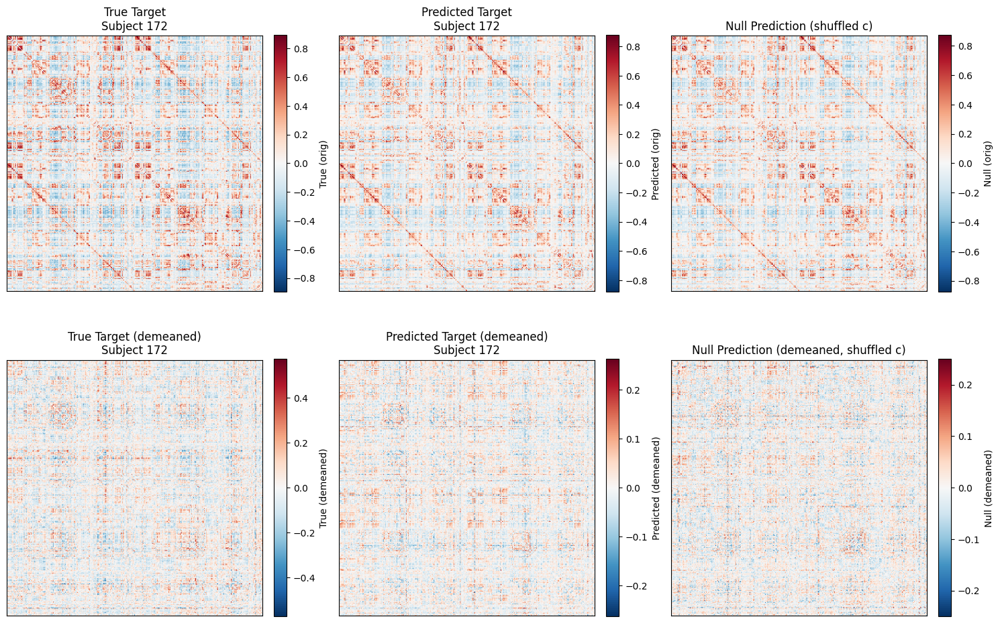

In [14]:
results = plot_pca_inference_with_null(cross_modal_pca_model, HCP_test, subj_idx=None, seed=0)

### Cross-modal (SC-to-FC) Krakencoder model

In [101]:
from scipy.io import loadmat

# --- Load predicted .mat and set source parcellation/conn type ---
parcellation = 'Glasser'
conn_type = 'SC' # Source conn type

### TRUE DATA
mat = loadmat('./krakencoder/example_data/mydata_Glasser_inputs.mat')
conndata_Glasser = {}
for ckey in ['FCcorr_Glasser_hpf', 'SCifod2act_Glasser_volnorm']:
    cell_array = mat[ckey]['data'][0][0][0]  # shape: (1, 957), each cell is 360x360
    nsubj = cell_array.shape[0]
    arr3d = np.stack([cell_array[i] for i in range(nsubj)], axis=0)  # (957, 360, 360)

    # Flatten each subject's matrix into upper triangle (excluding diagonal) using square2tri
    data_tri = np.stack([square2tri(arr3d[i], k=1) for i in range(arr3d.shape[0])], axis=0)  # (957, n_edges)
    conndata_Glasser[ckey] = {'data': data_tri}
    print("conndata[%r]['data'] shape:" % ckey, conndata_Glasser[ckey]['data'].shape)

### KRAKEN PREDICTIONS
matfile = loadmat(f"./krakencoder/example_data/mydata_kraken_source_{parcellation}.{conn_type}.mat")
outputtypes = matfile['outputtypes']
predicted_alltypes = matfile['predicted_alltypes']

headers = [
    'FCcorr_Glasser_hpf',
    'FCcorr_4S456Parcels_hpf',
    'SCifod2act_Glasser_volnorm',
    'SCifod2act_4S456Parcels_volnorm'
]

preds = predicted_alltypes[0][0][0][0][0]

# Grab Glasser predictions
predicted_alltypes_Glasser = {
    'FCcorr_Glasser_hpf':    {'data': np.array(preds[1])},
    'SCifod2act_Glasser_volnorm': {'data': np.array(preds[3])}
}

kraken_preds = predicted_alltypes_Glasser['FCcorr_Glasser_hpf']['data']
kraken_train_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['train']]
kraken_val_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['val']]
kraken_test_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['test']]

conndata['FCcorr_Glasser_hpf']['data'] shape: (957, 64620)
conndata['SCifod2act_Glasser_volnorm']['data'] shape: (957, 64620)


In [102]:
train_evaluator = Evaluator(kraken_train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(kraken_val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(kraken_test_preds, test_targets, HCP_test, HCP_Dataset)

train_metrics = train_evaluator._metrics
val_metrics = val_evaluator._metrics
test_metrics = test_evaluator._metrics

train_evaluator._output_metrics()
val_evaluator._output_metrics()
test_evaluator._output_metrics()

 Evaluation Metrics for Partition: 'train'
--------------------------------------------------
Mean Squared Error       : 0.0110
R2 Score                 : 0.1864
Pearson Corr.            : 0.8686
Demeaned Pearson Corr.   : 0.5224
Average Rank             : 0.8466
Top-1 Accuracy           : 0.2182
 Evaluation Metrics for Partition: 'val'
--------------------------------------------------
Mean Squared Error       : 0.0147
R2 Score                 : -0.0452
Pearson Corr.            : 0.8262
Demeaned Pearson Corr.   : 0.0664
Average Rank             : 0.5566
Top-1 Accuracy           : 0.0380
 Evaluation Metrics for Partition: 'test'
--------------------------------------------------
Mean Squared Error       : 0.0136
R2 Score                 : -0.0314
Pearson Corr.            : 0.8358
Demeaned Pearson Corr.   : 0.0829
Average Rank             : 0.5660
Top-1 Accuracy           : 0.0154


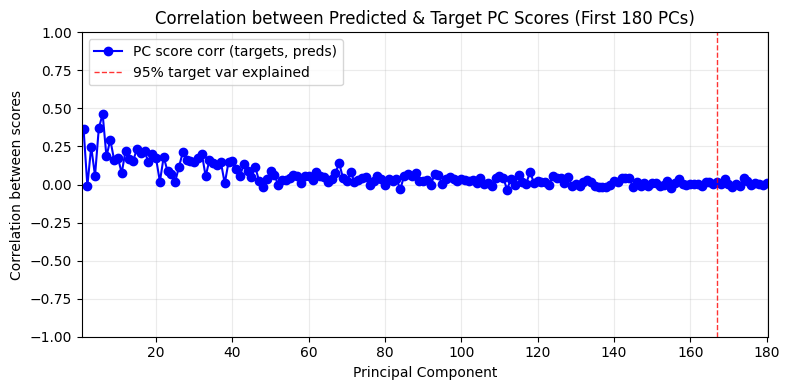

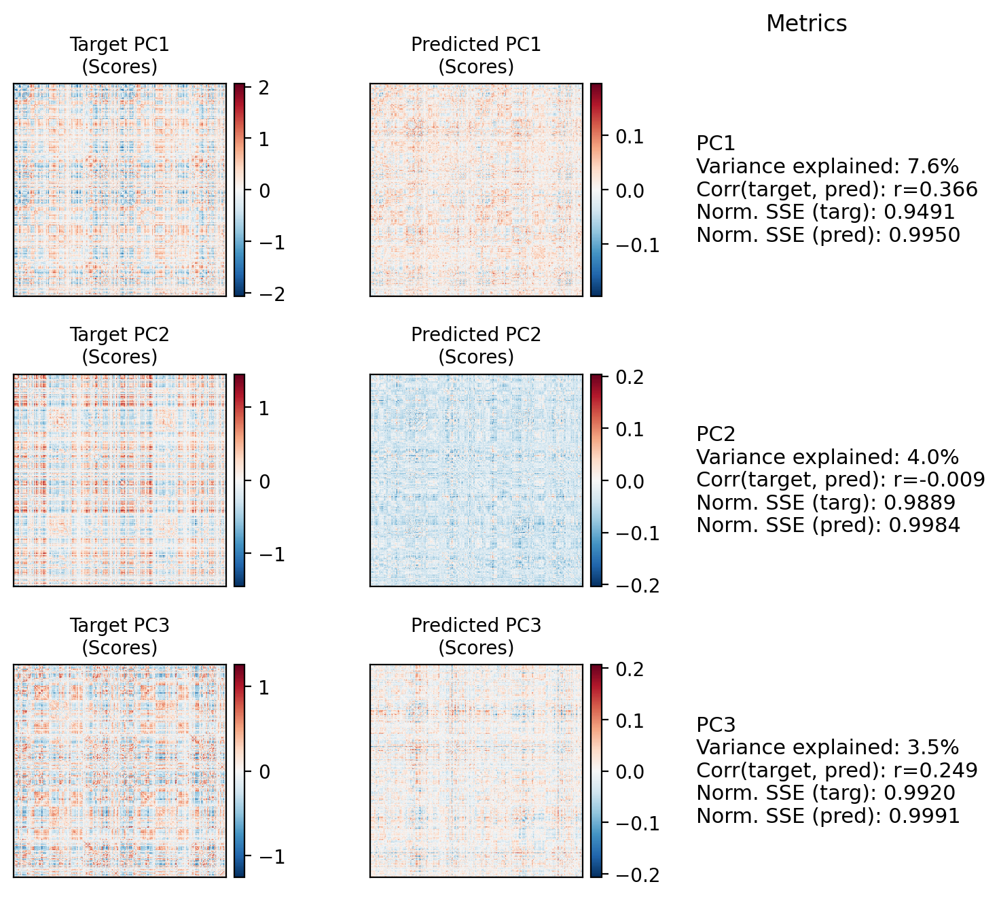

(PCA(), PCA())

In [103]:
test_evaluator.evaluate_pca_structure(num_pcs=180, show_first_pcs=3)

Top-1 accuracy: 0.041  (8 of 195 subjects had rank 1)
Average rank percentile: 0.737


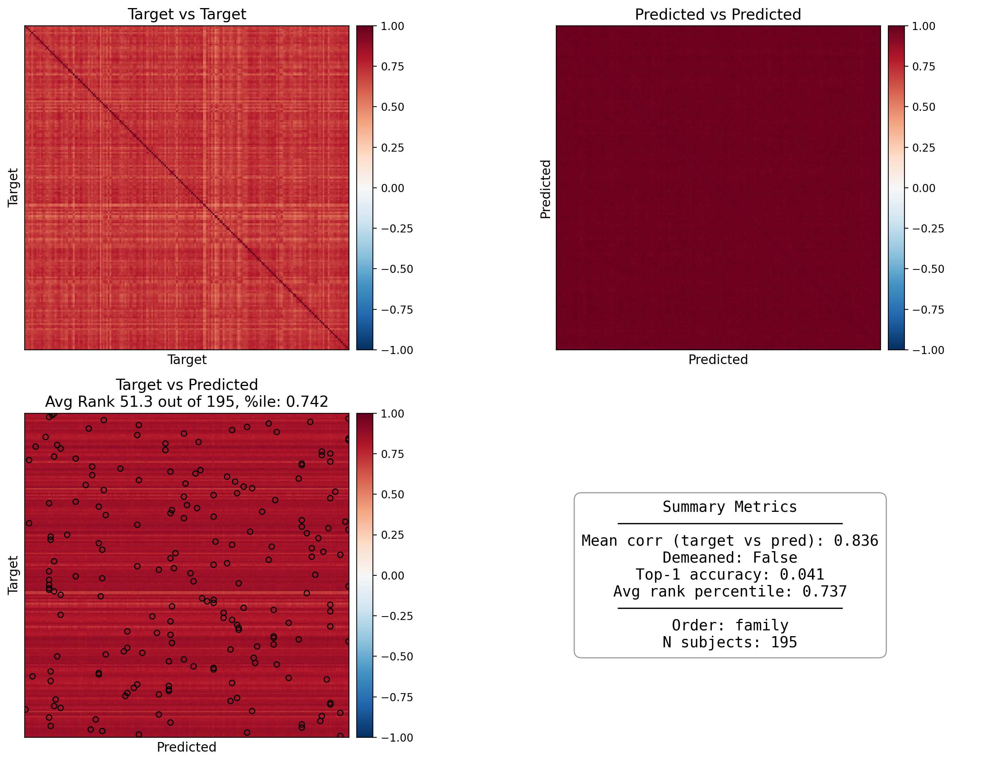

{'mean_corr': np.float32(0.8358165),
 'demeaned': False,
 'top1_acc': np.float64(0.041025641025641026),
 'avg_rank_percentile': np.float64(0.737120315581854),
 'ranklist': array([ 28,  39,  81,  47,   5,  94, 143,  30, 150,  56,   7,  32,   7,
        110,   2, 167, 186,  58,  75,   1,  21,   1,   8,  97,  24, 183,
         55,  14,  41, 163,   8,  45, 173,   2, 128,   7,  20,   5,  37,
         93,   2,   6,   6,  73,  26,  31,   2, 123, 159, 105, 103, 127,
         32,  45,  10,  11,  22,   6,  38,   4,  37,  25,   7,   2,  11,
         69,  76,   1,   5,  72,  18,  78,  39, 157, 173,  85,  37,   5,
        155, 101,  19,  41,  11,  37, 128,   2, 140,   1,   2,  25, 116,
        106,  49,  23,  27,   5,  12, 119,  42,  96,  97,   1, 119,  70,
         23,  49, 144,  38,  39,  49,  14,  85,   9, 111, 109,  59,   3,
         42, 180,   3,  13, 123,   3,   8,   1,  25,   4,   1,   3, 107,
         37,   9,  37,   4,   2,  24, 166,  44,  69,   4, 128,  33,   5,
         32,  10, 115,  53

In [104]:
test_evaluator.plot_identifiability_heatmaps(order_by='family', demeaned=False, include_black_circles=True, include_blue_dots=False, dpi=200, figsize=(14, 10))

In [105]:
test_evaluator.compute_identifiability_stats(demeaned=False)

{'r_matrix': array([[0.84726226, 0.8809967 , 0.8042626 , ..., 0.8480839 , 0.8250248 ,
         0.84530413],
        [0.8518268 , 0.8674387 , 0.8203218 , ..., 0.82217085, 0.8242657 ,
         0.84530205],
        [0.8403591 , 0.883014  , 0.8191623 , ..., 0.8438221 , 0.8205457 ,
         0.85034376],
        ...,
        [0.8603432 , 0.87469935, 0.80073047, ..., 0.846507  , 0.82267475,
         0.8297581 ],
        [0.84412557, 0.87731403, 0.81182253, ..., 0.8445395 , 0.8252079 ,
         0.8456372 ],
        [0.854944  , 0.8605057 , 0.8119942 , ..., 0.8184826 , 0.8184342 ,
         0.8524675 ]], shape=(195, 195), dtype=float32),
 'r_intra': array([0.84726226, 0.8674387 , 0.8191623 , 0.84380764, 0.83363634,
        0.8481169 , 0.8522176 , 0.8493334 , 0.8924914 , 0.86951256,
        0.85234636, 0.8573557 , 0.86435217, 0.8472645 , 0.85865974,
        0.86854637, 0.8705156 , 0.7781812 , 0.8519929 , 0.8687566 ,
        0.85247236, 0.8331195 , 0.8364533 , 0.8512144 , 0.80992407,
        0.784

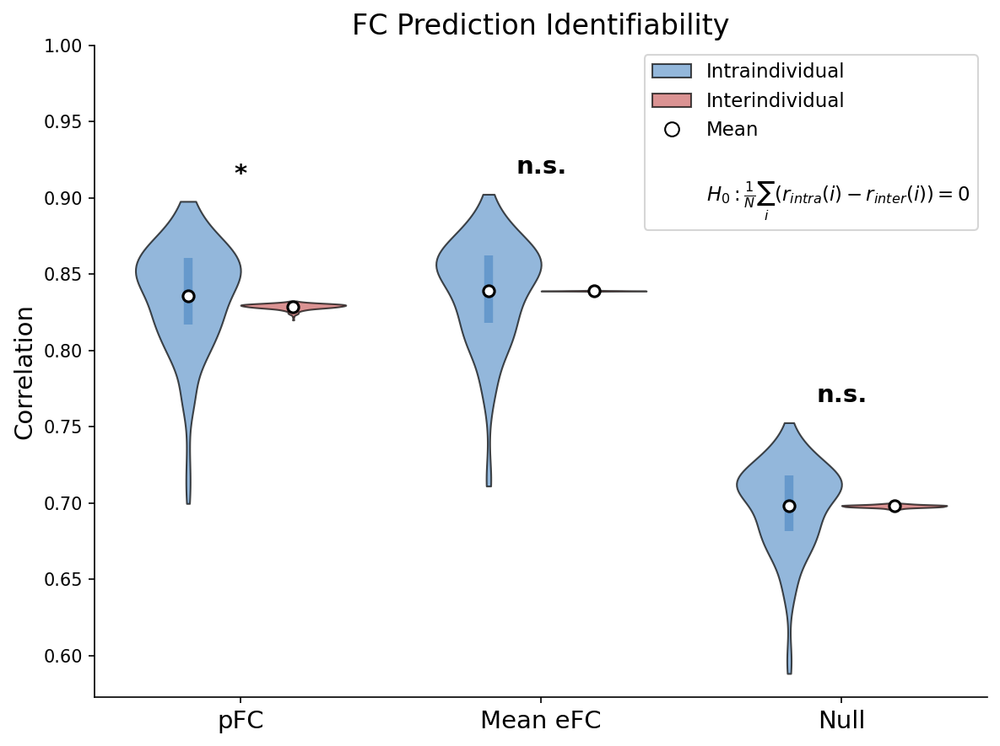


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.8358     0.8288     0.0070     2.81       5.48e-03     0.20      
Mean eFC     0.8390     0.8390     -0.0000    -0.00      1.00e+00     -0.00     
Null         0.6982     0.6980     0.0001     0.06       9.48e-01     0.00      


In [106]:
# Full violin plot with baselines
results = test_evaluator.plot_identifiability_violin(
    include_mean_baseline=True,
    include_noise_baseline=True,
    noise_scale=1.0,
    demeaned=False, 
    p_threshold=0.05
)

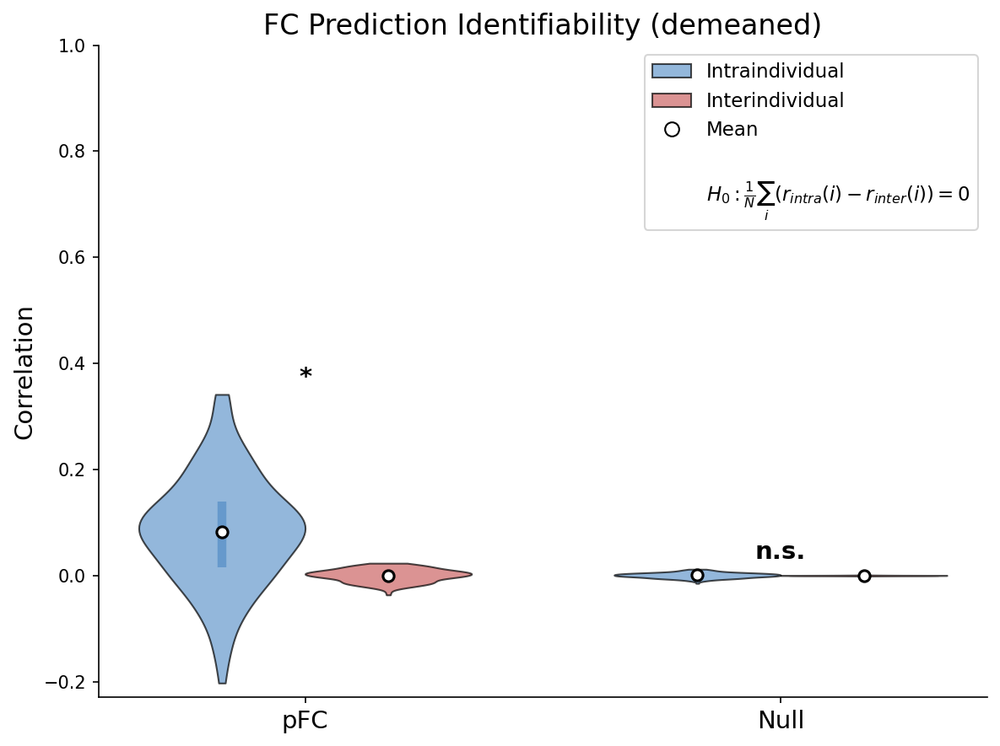


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0829     0.0003     0.0826     11.15      1.24e-22     0.80      
Null         0.0004     -0.0001    0.0005     1.35       1.80e-01     0.10      


In [107]:
# Full violin plot with baselines
results = test_evaluator.plot_identifiability_violin(
    include_mean_baseline=True,
    include_noise_baseline=True,
    noise_scale=1.0,
    demeaned=True,
    p_threshold=0.05
)